In [60]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [61]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

In [62]:
df = pd.read_csv('startup_funding.csv',encoding='utf-8')
df.replace('\\xc2\\xa0', '', regex=True, inplace=True)
df.head()

,Sr No,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
0,1,09/01/2020,BYJU’S,E-Tech,E-learning,Bengaluru,Tiger Global Management,Private Equity Round,"20,00,00,000",NaN
1,2,13/01/2020,Shuttl,Transportation,App based shuttle service,Gurgaon,Susquehanna Growth Equity,Series C,"80,48,394",NaN
2,3,09/01/2020,Mamaearth,E-commerce,Retailer of baby and toddler products,Bengaluru,Sequoia Capital India,Series B,"1,83,58,860",NaN
3,4,02/01/2020,https://www.wealthbucket.in/,FinTech,Online Investment,New Delhi,Vinod Khatumal,Pre-series A,"30,00,000",NaN
4,5,02/01/2020,Fashor,Fashion and Apparel,Embroiled Clothes For Women,Mumbai,Sprout Venture Partners,Seed Round,"18,00,000",NaN


In [63]:
df.shape

(3044, 10)

In [64]:
df.columns

Index(['Sr No', 'Date dd/mm/yyyy', 'Startup Name', 'Industry Vertical',
       'SubVertical', 'City  Location', 'Investors Name', 'InvestmentnType',
       'Amount in USD', 'Remarks'],
      dtype='object')

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3044 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Sr No              3044 non-null   int64 
 1   Date dd/mm/yyyy    3044 non-null   object
 2   Startup Name       3044 non-null   object
 3   Industry Vertical  2873 non-null   object
 4   SubVertical        2108 non-null   object
 5   City  Location     2864 non-null   object
 6   Investors Name     3020 non-null   object
 7   InvestmentnType    3040 non-null   object
 8   Amount in USD      2084 non-null   object
 9   Remarks            419 non-null    object
dtypes: int64(1), object(9)
memory usage: 237.9+ KB


In [66]:
df.describe(include="all")

,Sr No,Date dd/mm/yyyy,Startup Name,Industry Vertical,SubVertical,City Location,Investors Name,InvestmentnType,Amount in USD,Remarks
count,3044.000000,3044,3044,2873,2108,2864,3020,3040,2084,419
unique,NaN,1035,2459,821,1942,112,2412,55,471,72
top,NaN,02/02/2015,Ola Cabs,Consumer Internet,Online Lending Platform,Bangalore,Undisclosed Investors,Private Equity,"10,00,000",Series A
freq,NaN,11,8,941,11,700,39,1356,165,175
mean,1522.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,878.871435,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,761.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,1522.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,2283.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
df.isna().sum()

Sr No                   0
Date dd/mm/yyyy         0
Startup Name            0
Industry Vertical     171
SubVertical           936
City  Location        180
Investors Name         24
InvestmentnType         4
Amount in USD         960
Remarks              2625
dtype: int64

In [68]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3044 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Sr No              3044 non-null   int64 
 1   Date dd/mm/yyyy    3044 non-null   object
 2   Startup Name       3044 non-null   object
 3   Industry Vertical  2873 non-null   object
 4   SubVertical        2108 non-null   object
 5   City  Location     2864 non-null   object
 6   Investors Name     3020 non-null   object
 7   InvestmentnType    3040 non-null   object
 8   Amount in USD      2084 non-null   object
 9   Remarks            419 non-null    object
dtypes: int64(1), object(9)
memory usage: 237.9+ KB


In [69]:
df['Startup Name'].values

array(['BYJU’S', 'Shuttl', 'Mamaearth', ..., 'Mad Street Den',
       'Simplotel', 'couponmachine.in'], dtype=object)

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3044 entries, 0 to 3043
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Sr No              3044 non-null   int64 
 1   Date dd/mm/yyyy    3044 non-null   object
 2   Startup Name       3044 non-null   object
 3   Industry Vertical  2873 non-null   object
 4   SubVertical        2108 non-null   object
 5   City  Location     2864 non-null   object
 6   Investors Name     3020 non-null   object
 7   InvestmentnType    3040 non-null   object
 8   Amount in USD      2084 non-null   object
 9   Remarks            419 non-null    object
dtypes: int64(1), object(9)
memory usage: 237.9+ KB


In [71]:
df.set_index('Sr No',inplace=True)

In [72]:
df.drop(columns='Remarks',inplace=True)

In [73]:
df.columns

Index(['Date dd/mm/yyyy', 'Startup Name', 'Industry Vertical', 'SubVertical',
       'City  Location', 'Investors Name', 'InvestmentnType', 'Amount in USD'],
      dtype='object')

In [74]:
df.rename(columns = {
    'Date dd/mm/yyyy':'Date',
    'Startup Name': 'Startup',
    'Industry Vertical': 'Vertical',
    'City  Location':'City',
    'Investors Name':'Investors',
    'InvestmentnType':'Round',
    'Amount in USD':'Amount'
},inplace=True)

In [75]:
df['Amount'] = df['Amount'].fillna('0')

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3044 entries, 1 to 3044
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Date         3044 non-null   object
 1   Startup      3044 non-null   object
 2   Vertical     2873 non-null   object
 3   SubVertical  2108 non-null   object
 4   City         2864 non-null   object
 5   Investors    3020 non-null   object
 6   Round        3040 non-null   object
 7   Amount       3044 non-null   object
dtypes: object(8)
memory usage: 214.0+ KB


In [77]:
df.Amount = df.Amount.str.replace(',','')
df.Amount = df.Amount.str.replace('undisclosed','0')
df.Amount = df.Amount.str.replace('Undisclosed','0')
df.Amount = df.Amount.str.replace('unknown','0')
df.Amount = df.Amount.str.replace('+','')
# df.Amount = df.Amount.str.replace('\\\\xc2\\\\xa','')
df.Amount = df.Amount.str.replace(' ','0')
df.Amount = df.Amount.str.replace('N/A','0')
df.Amount = df.Amount.astype('float')
df.Amount = df.Amount.apply(lambda x: x*85.58/10000000)

In [78]:
df.Date = df.Date.str.replace('05/072018','05/07/2018')
df.Date = df.Date.str.replace('01/07/015','01/07/2015')
df.Date = df.Date.str.replace("22/01//2015","22/01/2015")
df.Date = df.Date.str.replace("\xc2\xa010/07/2015","10/07/2015")
df.Date = df.Date.str.replace("\\xc2\\xa010/07/2015","10/07/2015")
df.Date = pd.to_datetime(df['Date'],format='%d/%m/%Y',errors='coerce')

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3044 entries, 1 to 3044
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         3039 non-null   datetime64[ns]
 1   Startup      3044 non-null   object        
 2   Vertical     2873 non-null   object        
 3   SubVertical  2108 non-null   object        
 4   City         2864 non-null   object        
 5   Investors    3020 non-null   object        
 6   Round        3040 non-null   object        
 7   Amount       3044 non-null   float64       
dtypes: datetime64[ns](1), float64(1), object(6)
memory usage: 214.0+ KB


In [80]:
df.isna().sum()

Date             5
Startup          0
Vertical       171
SubVertical    936
City           180
Investors       24
Round            4
Amount           0
dtype: int64

In [81]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount'],
      dtype='object')

In [82]:
df = df.dropna(subset=['Date', 'Startup', 'Vertical', 'City', 'Investors','Round', 'Amount'])
df.shape

(2832, 8)

In [83]:
df['Investors'] = df['Investors'].replace('Undisclosed investors','Undisclosed Investors')

In [84]:
sorted(set(df.Investors.str.split(',').sum()))

['',
 '  & other Angel investors.',
 '  91SpringBoard',
 '  Aarin Capital',
 '  Abhishek Jain',
 '  Accel Partners',
 '  Accel Partners India',
 '  Amit Ranjan',
 '  Aprameya Radhakrishna',
 '  Arjun Malhotra',
 '  Arpan Nagdeve',
 '  Badal Malick',
 '  Balamurali Krishna',
 '  Capital Advisers',
 '  Eight Roads Ventures',
 '  Falcon Edge',
 '  Ganapathy Venugopal.',
 '  Ganayantrika Systems',
 '  Helion Ventures',
 '  Inventus Capital',
 '  Kaleden Holdings',
 '  Kunal Shah',
 '  Lightbox Ventures',
 '  Lightspeed India',
 '  Lok Capital',
 '  Lumis Partners',
 '  Manish Singhal',
 '  Mayfield',
 '  Mohandas Pai',
 '  Mohit Saxena',
 '  Nirvana Ventures Advisors',
 '  Phanindra Sama',
 '  Puneet Dalmia',
 '  Rahul Chawla',
 '  Ralph Berezan',
 '  Ramkumar Nishtal',
 '  Ravi Saxena & Others',
 '  Ruchi Sanghvi & Others',
 '  SAIF Partners',
 '  Sandeep Aggarwal',
 '  Sandeep Tandon',
 '  Smart Start Fund; Kunal Shah',
 '  Tiger Global Management & others',
 '  Times Internet',
 '  Trac

In [85]:
df[df['Investors'].str.contains('Anoop Goyal')]

,Date,Startup,Vertical,SubVertical,City,Investors,Round,Amount
Sr No,,,,,,,,
2795,2015-05-22,Nudgespot,Customer Engagement Platform,NaN,Bangalore,"Kae Capital, Anoop Goyal, Mike Shah, VA Sastry",Seed Funding,5.34875


In [86]:
df[df['Investors'].str.contains('Sequoia')].groupby('Startup')['Amount'].sum().sort_values(ascending=False)

Startup
Oyo Rooms                              2995.300000
OYO Rooms                              2139.500000
Zilingo                                2018.832200
Grofers                                1326.490000
BlackBuck                              1283.700000
Freshworks                             1283.700000
Byju\\xe2\\x80\\x99s                   1069.750000
CarDekho                                941.380000
Oyorooms                                855.800000
Oyo                                     855.800000
Five Star Group                         855.800000
practo                                  770.220000
Dhruva                                  684.640000
Urban Ladder                            660.677600
Chillr                                  650.408000
Moglix                                  513.480000
FreshDesk                               470.690000
Druva                                   436.458000
Homelane                                427.900000
MedGenome              

In [87]:
df[df['Investors'].str.contains('Sequoia')].groupby('Vertical')['Amount'].sum().sort_values(ascending=False)

Vertical
Consumer Internet                             8013.967940
Ecommerce                                     1934.108000
Technology                                    1773.645500
Transport                                     1283.700000
Software                                      1283.700000
Hyper-local Grocery Delivery platform         1026.960000
Automobile                                     941.380000
Budget Hotel Accommodation                     855.800000
Budget Hotel accommodation brand               855.800000
Fin-Tech                                       855.800000
Doctor Appointment booking app                 770.220000
eCommerce                                      761.662000
E-Commerce                                     701.756000
Peer-to-Peer Money Transfer & Recharge App     599.060000
Education                                      462.132000
Online Furnishing\\neCommerce                  427.900000
Home Furnishing Solutions                      427.900000
Cloud

In [88]:
df[df['Investors'].str.contains('Sequoia')].groupby('Round')['Amount'].sum().sort_values(ascending=False)

Round
Private Equity          21710.619040
Series D                 3731.288000
Series H                 1283.700000
Series C                  941.380000
Series B                  379.623124
Private Funding           125.631440
Seed Funding               50.492200
Series A                   42.790000
Maiden Round               38.511000
Seed/ Angel Funding        25.674000
Seed / Angel Funding        2.139500
Angel / Seed Funding        0.000000
Name: Amount, dtype: float64

In [89]:
df[df['Investors'].str.contains('Sequoia')].groupby('City')['Amount'].sum().sort_values(ascending=False)

City
Gurgaon               7940.540300
Bangalore             5209.254600
New Delhi             2625.594400
Mumbai                2324.352800
Bengaluru             2292.849604
India/Singapore       1934.108000
Pune                  1470.264400
Chennai               1377.838000
San Francisco         1283.700000
Jaipur                 992.728000
Singapore              513.480000
Ahmedabad              136.928000
Gurugram                85.580000
Bangalore/ Bangkok      84.724200
Hyderabad               59.906000
Name: Amount, dtype: float64

In [90]:
df['Year']= df['Date'].dt.year

In [91]:
df[df['Investors'].str.contains('Sequoia')].groupby('Year')['Amount'].sum()

Year
2015    8963.649200
2016    4418.067500
2017    6585.381000
2018    1947.458480
2019    6260.177000
2020     157.115124
Name: Amount, dtype: float64

In [92]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year'],
      dtype='object')

In [93]:
df.groupby('Startup')['Amount'].max().sort_values(ascending=False).head(1).index[0]

'Rapido Bike Taxi'

In [94]:
df.groupby('Startup')['Amount'].sum().mean()

133.68291930105332

In [95]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year'],
      dtype='object')

In [96]:
df['Startup'].nunique()

2307

In [97]:
df['month_num'] = df.Date.dt.month

In [98]:
df['month_name'] = df.Date.dt.month_name()

In [99]:
df['Month_Year']= df.month_name.astype('str') +'-'+  df.Year.astype('str')

In [100]:
temp_df = df.groupby(['Year','month_num','Month_Year'],as_index=False).agg(
    {'Startup':'count',
    'Amount':'sum'})

<Axes: >

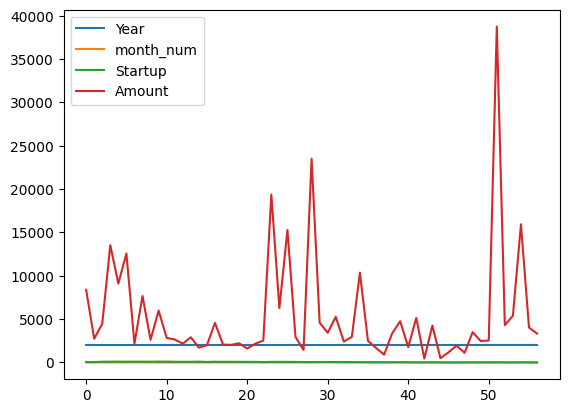

In [101]:
temp_df.plot()

In [102]:
temp_df.head()

,Year,month_num,Month_Year,Startup,Amount
0,2015,4,April-2015,61,8382.561000
1,2015,5,May-2015,55,2739.715330
2,2015,6,June-2015,84,4462.945652
3,2015,7,July-2015,96,13530.685806
4,2015,8,August-2015,98,9104.137328


In [103]:
grow_data = df.groupby('Year',as_index=False)['Amount'].sum()
grow_data['Previous_Value'] = grow_data['Amount'].shift(1)
grow_data['YoY_Growth'] = round((grow_data['Amount'] - grow_data['Previous_Value']) / grow_data['Previous_Value'] * 100,2)
grow_data = grow_data.fillna(0)
grow_data['YoY_Growth'].iloc[1:].mean()

16.344

In [104]:
df.groupby('Startup')['Amount'].sum().sort_values(ascending=False).head()

Startup
Flipkart            34742.9126
Rapido Bike Taxi    33376.2000
Paytm               26948.7141
Ola                  8425.3510
Udaan                7445.4600
Name: Amount, dtype: float64

In [105]:
highest_investment_startup = df.groupby('Startup')['Amount'].sum().sort_values(ascending=False)
highest_investment_startup

Startup
Flipkart                                                  34742.912600
Rapido Bike Taxi                                          33376.200000
Paytm                                                     26948.714100
Ola                                                        8425.351000
Udaan                                                      7445.460000
Snapdeal                                                   5990.600000
Flipkart.com                                               5990.600000
Ola Cabs                                                   5731.292600
BigBasket                                                  4338.906000
GOQii                                                      3851.100000
Zomato                                                     3722.730000
Olacabs                                                    3423.200000
Oyo Rooms                                                  2995.300000
Automation Anywhere                                        2567.40000

In [106]:
active_investors = df['Investors'].value_counts().sort_values(ascending=False).head(10)
active_investors

Investors
Undisclosed Investors    66
Indian Angel Network     23
Ratan Tata               23
Kalaari Capital          15
Sequoia Capital          13
Accel Partners           12
Undisclosed Investor     12
undisclosed investors    11
Venture Catalysts        11
Brand Capital            11
Name: count, dtype: int64

In [107]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [108]:
Least_investors = df.groupby(['Investors'])['Amount'].count().sort_values(ascending=True).head()
Least_investors

Investors
  Sandeep Aggarwal, Teruhide Sato    1
R M Picture Company Pvt. Ltd.        1
Quona Capital Management             1
Quona Capital                        1
Quintillion Media, 500 Startups      1
Name: Amount, dtype: int64

In [109]:
city_sector_correlation = df.groupby(['City', 'Vertical'])['Amount'].sum().unstack()
city_sector_correlation

Vertical,Casual Dining restaurant Chain,Contact Center Software Platform,Fashion Info Aggregator App,News Aggregator mobile app,Online Grocery Delivery,Online Jewellery Store,Online Study Notes Marketplace,Pre-School Chain,Premium Loyalty Rewards Point Management,360-degree view creating platform,3D Printer Manufacturer,AI,API Workflow platform,Accounting,Activity Based Social Network,Advertising & Marketing Community Networking platform,"Advertising, Marketing",Aerospace,Affordable Education,Affordable Hotel Booking Online,Agriculture,Agtech,Algorithmic Match Making Platform,Alternate Mobile Monetization platform,App Analytics platform,App based Bus Pooling Services,App based Fitness coaching,App security testing platform,Architectural Design & Consulting,Artificial Intelligence,Artificial Intelligence Ecommerce Chatbot,Artificial Intelligence platform,Artist / Designer Marketplace,Asset Financing platform,Auto,Auto Insurance Online platform,Auto Rickshaw Based Services,Auto Rickshaw based Logistics,Automated Storage & Warehousing Solution,Automation,Automobile,Automotive,Automotive Services platform,Autorickshaw Aggregator & Booking platform,B2B,B2B Marketing,B2B Merchandize platform,B2B Mobile Auction Marketplace,B2B Platform,B2B eCommerce Marketplace,B2B logistics delivery platform,B2B marketplace for industrial goods,B2B-focused foodtech startup,B2C Messaging App,BFSI,Banking Analytics Platform,Beauty & Lifestyle Mobile Marketplace,Beauty & Lifestyle platform,Beauty & Wellness Mobile App,Beauty & Wellness Products e-tailer,Beauty & Wellness Services Marketplace,Beauty and Wellness Marketplace,Beauty and Wellness Platform,Beauty and Wellness platform,Beauty services Mobile Marketplace,Bespoke Merchandize Marketplace,Big Data & Analytics Services,Big Data & Analytics platform,Big Data & predictive Analysis Platform,Big Data Analytics Platform,Big Data Management Platform,Bike Rental Platform,"Bike, Appliances Renting marketplace",Brain Games Platform,Brand Licensing Startup,Branded Budget Hotel Marketplace,Branded Food products online sales,Budget Accommodation Platform,Budget Accommodation aggregator,Budget Hotel Accommodation,Budget Hotel accommodation brand,Budget Hotels Aggregator,Bus Aggregation and rental mobile app,Business IT Intelligence Services,Business Messaging App,Business and IT consulting,Business intelligence & Analytics,CRM / Analytics platform,Cab Aggregator,Cab Booking app platform,Cab Sharing service Mobile app,Cab rental Mobile app,Cab search Comparison & Booking platform,Car & Bike ecommerce platform,Car Aggregator & Retail Mobile App,Car Maintenance & Management mobile app,Career Community for Women,Career Development,Casual Dating App,Celebrity Fashion Brand,Chain of Tea Caf\\xc3\\xa9\\xe2\\x80\\x99s,Chat based personal Assistant App,Chinese food delivery,Citizens Engagement Platform,Clean Tech,Clean-tech,Clinical Genomics Provider,Cloud Based Collaboration platform,Cloud Based Hotel Sales Platform,Cloud Data Integration Platform,Cloud Enterprise Mobility Platform,Cloud Enterprise Software,Cloud software solutions,Cloud-based Hotel Booking Platform,Clud based Learning platform,Community Driven News/Views Platform,Competitive exam learning platform,Compliance,Consumer Goods,Consumer Interne,Consumer Internet,Consumer Portal,Consumer Technology,Consumer internet,Consumer lending marketplace,Content Discovery & reward points platform,Content Management Software Solutions,Content-based Subscription eCommerce platform,Corporate Wellness App,Coupon Aggregator Platform,Credit Card Fraud protection solutions,Credit Management Services,Cricket Management Mobile Game,Cross-channel CRM platform,Cross-device retargeting platform,Crowd Funding Platform,Crowd funding platform,Crowdsourced Delivery platform,Curated Freelancer Marketplace,Custom Furniture Marketplace,Custom Made furniture e-tailer,Custom Merchandize platform,Customer Engagement Platform,Customer Service,Customer Service Platform,Dairy Based Product

In [110]:
df['City'].value_counts()

City
Bangalore                 699
Mumbai                    554
New Delhi                 421
Gurgaon                   285
Bengaluru                 136
Pune                      105
Hyderabad                  98
Chennai                    97
Noida                      92
Gurugram                   50
Ahmedabad                  38
Delhi                      30
Jaipur                     30
Kolkata                    21
Indore                     13
Chandigarh                 11
Vadodara                   10
Goa                         9
Singapore                   8
Coimbatore                  5
Pune / US                   4
Kanpur                      4
 Gurgaon                    4
Nagpur                      3
Bhopal                      3
Faridabad                   3
Mumbai/Bengaluru            2
Kochi                       2
Trivandrum                  2
Siliguri                    2
Bangalore / SFO             2
Gwalior                     2
Kormangala                  2
Surat

In [111]:
df.replace('\\xc2\\xa0', '', regex=True, inplace=True)

In [398]:
df.to_csv('Startup_clean.csv',index=False)

In [113]:
df['City'].replace('San Jose,','San Jose',inplace=True)
df['City'].replace(' Noida','Noida',inplace=True)
df['City'].replace(' Bangalore','Bangalore',inplace=True)
df['City'].replace('Bengaluru','Bangalore',inplace=True)
df['City'].replace(' New Delhi','New Delhi',inplace=True)
df['City'].replace(' Gurgaon','Gurgaon',inplace=True)
df['City'].replace(' Mumbai','Mumbai',inplace=True)

C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\1723080752.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['City'].replace('San Jose,','San Jose',inplace=True)
C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\1723080752.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.



In [114]:
year_trend = round(df.groupby('Year')['Amount'].sum().pct_change()*100,2)
year_trend = year_trend.reset_index()
year_trend['Color'] = np.where(year_trend["Amount"] < 0, 'red', 'green')
year_trend.fillna(0)
year_trend['Growth'] = year_trend['Amount'].astype('str')+'%'

In [115]:
year_trend

,Year,Amount,Color,Growth
0,2015,NaN,green,nan%
1,2016,-48.22,red,-48.22%
2,2017,172.37,green,172.37%
3,2018,-56.71,red,-56.71%
4,2019,110.17,green,110.17%
5,2020,-95.89,red,-95.89%


In [116]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [117]:
df.Round.replace('Venture','Venture Round',inplace=True)
df.Round.replace('Venture - Series Unknown','Venture Round',inplace=True)
df.Round.replace('Single Venture','Venture Round',inplace=True)

df.Round.replace('pre-Series A','Pre-Series A',inplace=True)
df.Round.replace('pre-series A','Pre-Series A',inplace=True)
df.Round.replace('Pre Series A','Pre-Series A',inplace=True)
df.Round.replace('Pre-series A','Pre-Series A',inplace=True)

df.Round.replace('Private','Private Funding',inplace=True)
df.Round.replace('Private Equity','Private Funding',inplace=True)
df.Round.replace('PrivateEquity','Private Funding',inplace=True)

df.Round.replace('Series B (Extension)','Series B',inplace=True)

df.Round.replace('Debt','Debt Funding',inplace=True)
df.Round.replace('Debt and Preference capital','Debt Funding',inplace=True)
df.Round.replace('Debt-Funding','Debt Funding',inplace=True)

C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\3396668605.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.Round.replace('Venture','Venture Round',inplace=True)
C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\3396668605.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.


In [118]:
df['Round'].replace('Angel','Angel Funding',inplace=True)
df['Round'].replace('Angel / Seed Funding','Angel Funding',inplace=True)
df['Round'].replace('Angel Round','Angel Funding',inplace=True)
df['Round'].replace('Seed/ Angel Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed/Angel Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed / Angel Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed / Angle Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed Round','Angel Funding',inplace=True)
df['Round'].replace('Seed funding','Angel Funding',inplace=True)
df['Round'].replace('Seed/ Angel Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed/Angel Funding','Angel Funding',inplace=True)
df['Round'].replace('Seed','Angel Funding',inplace=True)


df['City'].replace('Ahemadabad','Ahemdabad',inplace=True)
df['City'].replace('Ahmedabad','Ahemdabad',inplace=True)

C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\2341051877.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Round'].replace('Angel','Angel Funding',inplace=True)
C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\2341051877.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

In [119]:
temp_df = df.groupby('Round',as_index=False)['Amount'].sum().sort_values(by='Amount',ascending=False)
temp_df['Share'] = temp_df.Amount / sum(temp_df.Amount)
temp_df

,Round,Amount,Share
12,Private Funding,213259.567646,0.691489
14,Series B,41122.865100,0.133340
16,Series D,12681.235842,0.041119
15,Series C,8940.700016,0.028990
0,Angel Funding,8608.427775,0.027913
6,Funding Round,8558.000000,0.027749
11,Private Equity Round,4330.348000,0.014041
19,Series G,1976.898000,0.006410
13,Series A,1738.985600,0.005639
3,Debt Funding,1437.600003,0.004661


In [120]:
temp_df = df.groupby(['City'],as_index=False).agg({'Round':'count'}).sort_values(by='Round',ascending=False)
temp_df

,City,Round
4,Bangalore,836
57,Mumbai,555
63,New Delhi,423
29,Gurgaon,289
75,Pune,105
35,Hyderabad,98
20,Chennai,97
70,Noida,93
31,Gurugram,50
1,Ahemdabad,40


In [121]:
df.Startup.value_counts().index

Index(['Ola Cabs', 'Swiggy', 'UrbanClap', 'Nykaa', 'Medinfi', 'Meesho',
       'Paytm', 'Jugnoo', 'Uniphore', 'Toppr',
       ...
       'Loan Frame', 'Securens', 'Intelligence Node', 'TicketNew',
       'FreeCharge', 'Leap India', 'Yostra', 'LearnTron', 'Vow Car Clinic',
       'PiQube'],
      dtype='object', name='Startup', length=2307)

In [122]:
temp_df= df.Startup.value_counts().reset_index()
temp_df.rename(columns={'count':'Funding_times'},inplace=True)

In [123]:
df.groupby(['Startup','Year'])['Startup'].count().sort_values(ascending=False)

Startup                                                 Year
Flipkart                                                2017    4
Ola Cabs                                                2017    4
NoBroker                                                2016    4
UrbanClap                                               2015    4
AyeFinance                                              2018    3
CarDekho                                                2019    3
Fynd                                                    2017    3
Swiggy                                                  2015    3
                                                        2016    3
TinyStep                                                2016    3
CredR                                                   2015    3
Jugnoo                                                  2015    3
Ola                                                     2017    3
Nykaa                                                   2018    3
Koovs          

In [124]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [125]:
df.groupby(['month_name','month_num'],as_index=False)['Amount'].sum().sort_values(by='month_num')

,month_name,month_num,Amount
4,January,1,15620.021840
3,February,2,17665.994615
7,March,3,24523.339313
0,April,4,19619.659631
8,May,5,25342.588027
6,June,6,14950.395533
5,July,7,24269.038318
1,August,8,77736.199332
11,September,9,28671.636334
10,October,10,13484.635208


In [126]:
city_sector_correlation = df.groupby(['City', 'Vertical'],as_index=False)['Amount'].sum()
city_sector_correlation

,City,Vertical,Amount
0,Agra,eCommerce,0.000000
1,Ahemdabad,Cloud Based Collaboration platform,0.855800
2,Ahemdabad,Consumer Internet,497.844534
3,Ahemdabad,Custom Merchandize platform,8.558000
4,Ahemdabad,E-Commerce,53.316340
5,Ahemdabad,Enterprise Communication Platform,0.000000
6,Ahemdabad,Finance,40.222600
7,Ahemdabad,Food & Beverage,0.000000
8,Ahemdabad,Food Customer analytics platform,2.567400
9,Ahemdabad,Global Healthcare products,136.928000


In [127]:
city_sector_correlation[city_sector_correlation.City=='Ahemdabad']

,City,Vertical,Amount
1,Ahemdabad,Cloud Based Collaboration platform,0.855800
2,Ahemdabad,Consumer Internet,497.844534
3,Ahemdabad,Custom Merchandize platform,8.558000
4,Ahemdabad,E-Commerce,53.316340
5,Ahemdabad,Enterprise Communication Platform,0.000000
6,Ahemdabad,Finance,40.222600
7,Ahemdabad,Food & Beverage,0.000000
8,Ahemdabad,Food Customer analytics platform,2.567400
9,Ahemdabad,Global Healthcare products,136.928000
10,Ahemdabad,Logistics service platform,2.096710


In [128]:
city_sector_correlation[city_sector_correlation['City']=='Ahemdabad'][['Vertical','Amount']]

,Vertical,Amount
1,Cloud Based Collaboration platform,0.855800
2,Consumer Internet,497.844534
3,Custom Merchandize platform,8.558000
4,E-Commerce,53.316340
5,Enterprise Communication Platform,0.000000
6,Finance,40.222600
7,Food & Beverage,0.000000
8,Food Customer analytics platform,2.567400
9,Global Healthcare products,136.928000
10,Logistics service platform,2.096710


In [129]:
sector_year_growth = df.groupby(['Year', 'Vertical'])['Amount'].sum().unstack().pct_change() * 100
sector_year_growth.T

C:\Users\mohsi\AppData\Local\Temp\ipykernel_25096\1942045799.py:1: FutureWarning: The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  sector_year_growth = df.groupby(['Year', 'Vertical'])['Amount'].sum().unstack().pct_change() * 100


Year,2015,2016,2017,2018,2019,2020
Vertical,,,,,,
Casual Dining restaurant Chain,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000
Contact Center Software Platform,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000
Fashion Info Aggregator App,NaN,NaN,NaN,NaN,NaN,NaN
News Aggregator mobile app,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000
Online Grocery Delivery,NaN,NaN,NaN,NaN,NaN,NaN
Online Jewellery Store,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000
Online Study Notes Marketplace,NaN,NaN,NaN,NaN,NaN,NaN
Pre-School Chain,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000
Premium Loyalty Rewards Point Management,NaN,0.00,0.000000,0.000000e+00,0.000000e+00,0.000000


In [130]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [131]:
top_investors = df.groupby('Investors')['Amount'].sum().sort_values(ascending=False).head(5).sum()
investor_concentration = (top_investors / df['Amount'].sum()) * 100
investor_concentration

28.476533786719855

In [132]:
repeat_investors = df['Investors'].value_counts()[df['Investors'].value_counts() > 1]
repeat_investors

Investors
Undisclosed Investors                                           66
Ratan Tata                                                      23
Indian Angel Network                                            23
Kalaari Capital                                                 15
Sequoia Capital                                                 13
Accel Partners                                                  12
Undisclosed Investor                                            12
undisclosed investors                                           11
Venture Catalysts                                               11
Brand Capital                                                   11
RoundGlass Partners                                             10
Nexus Venture Partners                                           9
Undisclosed investor                                             9
Info Edge (India) Ltd                                            9
Undisclosed                                         

In [148]:
cagr = ((df.groupby('Year')['Amount'].sum().iloc[-1] / df.groupby('Year')['Amount'].sum().iloc[0]) ** (1/len(df['Year'].unique()))) - 1
cagr

-0.3875420781700839

In [149]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [150]:
df[df['Investors'].str.contains('Sequoia')]['Startup'].value_counts().sum()

109

In [151]:
df[df['Investors'].str.contains('Sequoia')].groupby('City')['Amount'].sum()

City
Ahemdabad              136.928000
Bangalore             7502.104204
Bangalore/ Bangkok      84.724200
Chennai               1377.838000
Gurgaon               7940.540300
Gurugram                85.580000
Hyderabad               59.906000
India/Singapore       1934.108000
Jaipur                 992.728000
Mumbai                2324.352800
New Delhi             2625.594400
Pune                  1470.264400
San Francisco         1283.700000
Singapore              513.480000
Name: Amount, dtype: float64

In [152]:
df[df['Investors'].str.contains('Sequoia')].groupby('City')['Amount'].sum().sort_values(ascending=False)

City
Gurgaon               7940.540300
Bangalore             7502.104204
New Delhi             2625.594400
Mumbai                2324.352800
India/Singapore       1934.108000
Pune                  1470.264400
Chennai               1377.838000
San Francisco         1283.700000
Jaipur                 992.728000
Singapore              513.480000
Ahemdabad              136.928000
Gurugram                85.580000
Bangalore/ Bangkok      84.724200
Hyderabad               59.906000
Name: Amount, dtype: float64

In [153]:
df.groupby('City')['Amount'].count()

City
Agra                        2
Ahemdabad                  40
Amritsar                    1
Andheri                     1
Bangalore                 836
Bangalore / Palo Alto       1
Bangalore / SFO             2
Bangalore / San Mateo       1
Bangalore / USA             1
Bangalore/ Bangkok          2
Belgaum                     1
Bengaluru and Gurugram      1
Bhopal                      3
Bhubaneswar                 1
Bhubneswar                  1
Boston                      1
Burnsville                  1
California                  1
Chandigarh                 11
Chembur                     1
Chennai                    97
Chennai/ Singapore          1
Coimbatore                  5
Delhi                      30
Delhi & Cambridge           1
Faridabad                   3
Gaya                        1
Goa                         9
Goa/Hyderabad               1
Gurgaon                   289
Gurgaon / SFO               1
Gurugram                   50
Gwalior                     2
Harya

In [154]:
df[df['Investors'].str.contains('Sequoia')].groupby('Vertical')['Amount'].sum().sort_values(ascending=False).head(10)

Vertical
Consumer Internet                        8013.96794
Ecommerce                                1934.10800
Technology                               1773.64550
Transport                                1283.70000
Software                                 1283.70000
Hyper-local Grocery Delivery platform    1026.96000
Automobile                                941.38000
Budget Hotel Accommodation                855.80000
Budget Hotel accommodation brand          855.80000
Fin-Tech                                  855.80000
Name: Amount, dtype: float64

In [155]:
df[df['Investors'].str.contains('Sequoia')].groupby(['Startup'])['Amount'].sum().sort_values(ascending=False).head(10)

Startup
Oyo Rooms               2995.3000
OYO Rooms               2139.5000
Zilingo                 2018.8322
Grofers                 1326.4900
BlackBuck               1283.7000
Freshworks              1283.7000
Byju\\xe2\\x80\\x99s    1069.7500
CarDekho                 941.3800
Oyorooms                 855.8000
Oyo                      855.8000
Name: Amount, dtype: float64

In [156]:
df[df['Investors'].str.contains('Sequoia')]

,Date,Startup,Vertical,SubVertical,City,Investors,Round,Amount,Year,month_num,month_name,Month_Year
Sr No,,,,,,,,,,,,
3,2020-01-09,Mamaearth,E-commerce,Retailer of baby and toddler products,Bangalore,Sequoia Capital India,Series B,157.115124,2020,1,January,January-2020
18,2019-11-13,Freshworks,Software,Business and customer engagement tools,San Francisco,"Sequoia, CapitalG, Accel",Series H,1283.700000,2019,11,November,November-2019
36,2019-09-05,FPL Technologies,FinTech,Financial Services,Pune,"Matrix Partners India, Sequoia India",Maiden Round,38.511000,2019,9,September,September-2019
46,2019-08-01,Progcap,Finance,Supply Chain Management,New Delhi,Sequoia India,Series A,42.790000,2019,8,August,August-2019
69,2019-07-11,Moglix,E-Commerce,Industrial Tools and Equipments,Singapore,"Composite Capital Management, Sequoia Capital ...",Series D,513.480000,2019,7,July,July-2019
93,2019-05-01,BlackBuck,Transport,Logistics,Bangalore,Goldman Sachs Investment Partners and Silicon ...,Series D,1283.700000,2019,5,May,May-2019
108,2019-04-11,CleverTap,SaaS,Mobile analytics and marketing,Mumbai,"Sequoia India, Tiger Global Management, Accel ...",Series B,222.508000,2019,4,April,April-2019
114,2019-02-08,Zilingo,Ecommerce,Fashion & Apparel,India/Singapore,"Sequoia Capital and Temasek Holdings, EDBI, Bu...",Series D,1934.108000,2019,2,February,February-2019
117,2019-01-03,CarDekho,Automobile,Online Marketplace,Jaipur,"Sequoia India, Hillhouse Capital, Alphabet\\xe...",Series C,941.380000,2019,1,January,January-2019


In [167]:
df[df['Investors'].str.contains('Sequoia')]['City'].nunique()

14

In [ ]:
df[df['Investors'].str.contains(investor)]['Startup'].value_counts().sum(),2

In [187]:
highest_investement = df[df['Investors'].str.contains('Sequoia')].groupby(['Startup','Round','Year','City'])['Amount'].sum().sort_values(ascending=False).head(1)
highest_investement

Startup    Round            Year  City   
Oyo Rooms  Private Funding  2017  Gurgaon    2139.5
Name: Amount, dtype: float64

In [188]:
highest_investement.index[0][2]

2017

In [186]:
df[df['Investors'].str.contains('Sequoia')].groupby(['City','Year','Startup'])['Amount'].sum().sort_values(ascending=False).head(1)

City     Year  Startup  
Gurgaon  2017  Oyo Rooms    2139.5
Name: Amount, dtype: float64

In [195]:
yoy_growth = df.groupby(['Investors', 'Year'])['Amount'].sum().pct_change() * 100
yoy_growth

Investors                                                                                                                                                                          Year
  Sandeep Aggarwal, Teruhide Sato                                                                                                                                                  2015             NaN
 Forum Synergies PE Fund                                                                                                                                                           2015             inf
 Goldman Sachs                                                                                                                                                                     2015    1.000000e+02
 IndianIdeas.com                                                                                                                                                                   2015    9.350000e+01
 IvyCap Ventures

In [198]:
success_rate = (df.groupby('Investors')['Startup'].nunique() / df['Startup'].nunique() * 100).sort_values(ascending=False)
success_rate.reset_index()

,Investors,Startup
0,Undisclosed Investors,2.817512
1,Ratan Tata,0.996966
2,Indian Angel Network,0.996966
3,Kalaari Capital,0.650195
4,Sequoia Capital,0.563502
5,Undisclosed Investor,0.520156
6,Accel Partners,0.520156
7,Venture Catalysts,0.476810
8,undisclosed investors,0.476810
9,Brand Capital,0.476810


In [210]:
seasonality = df[df['Investors'].str.contains('Sequoia')].groupby(['month_name','month_num'],as_index=False)['Amount'].sum().sort_values('month_num')
# .groupby(['Investors', 'Month_Year'],as_index=False)['Amount'].sum()
seasonality

,month_name,month_num,Amount
4,January,1,1303.887124
3,February,2,2347.288240
7,March,3,1009.844000
0,April,4,4908.013000
8,May,5,1822.854000
6,June,6,1309.374000
5,July,7,2849.386100
1,August,8,3205.826800
11,September,9,3953.796000
10,October,10,1021.654040


In [225]:
round(df[df['Startup'].str.contains('CloudCherry')]['Amount'].sum(),2)

51.35

In [212]:
df.columns

Index(['Date', 'Startup', 'Vertical', 'SubVertical', 'City', 'Investors',
       'Round', 'Amount', 'Year', 'month_num', 'month_name', 'Month_Year'],
      dtype='object')

In [295]:
temp_df = df[df['Startup'].str.contains('Ola')].groupby(['Year','month_num','Month_Year','Startup','City'],as_index=False)['Amount'].sum().sort_index()
temp_df = temp_df.sort_values(by=['Year','month_num'],ascending=[False,False])
temp_df.iloc[0,:]

Year                2019
month_num              7
Month_Year     July-2019
Startup         Ola Cabs
City          Kormangala
Amount             8.558
Name: 11, dtype: object

In [248]:
df[df['Startup'].str.contains('Ola')]['Startup'].value_counts().sum()

14

In [263]:
df[df['Startup'].str.contains('Ola')]['City'].unique().size

3

In [267]:
df[df['Startup'].str.contains('Ola')]['City'].unique().size

3

In [302]:
df.groupby(['Investors','Vertical'])['Amount'].sum()

Investors                                                                                                                                                                          Vertical                                                  
  Sandeep Aggarwal, Teruhide Sato                                                                                                                                                   Fashion Info Aggregator App                                      0.000000
 Forum Synergies PE Fund                                                                                                                                                            Contact Center Software Platform                                42.790000
 Goldman Sachs                                                                                                                                                                      Casual Dining restaurant Chain                                  85.580000


In [303]:
df.groupby('Investors')['Amount'].sum() * 100

Investors
  Sandeep Aggarwal, Teruhide Sato                                                                                                                                                    0.000000e+00
 Forum Synergies PE Fund                                                                                                                                                             4.279000e+03
 Goldman Sachs                                                                                                                                                                       8.558000e+03
 IndianIdeas.com                                                                                                                                                                     1.655973e+04
 IvyCap Ventures, Accel Partners, Dragoneer Investment Group                                                                                                                         1.386396e+04
 LetsVenture, Kumar 

In [316]:
(df.groupby(['Investors','Vertical'])['Amount'].sum() / df[df['Investors'].str.contains('Sequoia')].groupby('Investors')['Amount'].sum() * 100).reset_index()

,Investors,Vertical,Amount
0,"Sandeep Aggarwal, Teruhide Sato",Fashion Info Aggregator App,NaN
1,Forum Synergies PE Fund,Contact Center Software Platform,NaN
2,Goldman Sachs,Casual Dining restaurant Chain,NaN
3,IndianIdeas.com,Premium Loyalty Rewards Point Management,NaN
4,"IvyCap Ventures, Accel Partners, Dragoneer In...",Online Jewellery Store,NaN
5,"LetsVenture, Kumar Bansal, Kshitij Jain",Pre-School Chain,NaN
6,Palaash Ventures,Online Grocery Delivery,NaN
7,"Rajeev Saraf, Arvind Jha, R. Satya Narayanan",Online Study Notes Marketplace,NaN
8,Tiger Global,News Aggregator mobile app,NaN
9,"""Kedaraa Capital, Ontario Teachers\\'""",Finance,NaN


In [315]:
investor_velocity = df[df['Investors'].str.contains('Sequoia')].groupby('Investors')['Date'].diff().mean()
investor_velocity

Timedelta('-179 days +07:03:31.764705882')

In [324]:
a = df.groupby(['Vertical'])['Amount'].sum()

In [353]:
a[a.index=='Banking Analytics Platform']

Vertical
Banking Analytics Platform    128.37
Name: Amount, dtype: float64

In [344]:
a.shape

(809,)

In [325]:
b = df[df['Investors'].str.contains('Sequoia')].groupby('Vertical')['Amount'].sum()

In [345]:
b.shape

(55,)

In [354]:
b[b.index=='Banking Analytics Platform']

Vertical
Banking Analytics Platform    128.37
Name: Amount, dtype: float64

In [347]:
c = (b/a)*100

In [348]:
c.reset_index().shape

(809, 2)

In [352]:
c.reset_index().dropna()

,Vertical,Amount
25,App based Bus Pooling Services,100.000000
40,Automobile,67.073171
55,Banking Analytics Platform,100.000000
79,Budget Hotel Accommodation,100.000000
80,Budget Hotel accommodation brand,100.000000
84,Business Messaging App,100.000000
106,Clinical Genomics Provider,100.000000
112,Cloud software solutions,100.000000
120,Consumer Internet,14.985537
130,Credit Card Fraud protection solutions,100.000000


In [357]:
investor_velocity = df[df['Investors']==''].groupby('Investors')['Date'].diff().mean()
investor_velocity

Timedelta('-151 days +19:41:56.129032258')

In [358]:
df[df['Startup'].str.contains('Shopsity')]

,Date,Startup,Vertical,SubVertical,City,Investors,Round,Amount,Year,month_num,month_name,Month_Year
Sr No,,,,,,,,,,,,
2605,2015-07-09,Shopsity,Fashion Info Aggregator App,NaN,Gurgaon,"Sandeep Aggarwal, Teruhide Sato",Angel Funding,0.0,2015,7,July,July-2015


In [366]:
sector_focus = df[df['Startup'].str.contains('Ola')].groupby('Startup')['Vertical'].apply(lambda x: x.mode()[0])
sector_focus.iloc[0]

'Consumer Internet'

In [370]:
df[df['Startup'].str.contains('Ola')]['Vertical']

Sr No
65                               Transport
90                               Transport
524                      Consumer Internet
571                      Consumer Internet
654                      Consumer Internet
749                      Consumer Internet
792                      Consumer Internet
890                      Consumer Internet
925                      Consumer Internet
2245    Car Aggregator & Retail Mobile App
2416                 Cab rental Mobile app
2459              Cab Booking app platform
2574                 Cab rental Mobile app
2821                        Cab Aggregator
Name: Vertical, dtype: object

In [374]:
df[df['Startup'].str.contains('Ola')].groupby('Startup')['City'].apply(lambda x: x.mode()[0]).iloc[0]

'Bangalore'

In [364]:
df[df['Startup'].str.contains('Ola')].groupby('Startup')['Vertical'].sum()

Startup
Ola             Consumer InternetConsumer InternetConsumer Int...
Ola Cabs        TransportConsumer InternetConsumer InternetCon...
Ola Electric                                            Transport
Olacabs                                            Cab Aggregator
Name: Vertical, dtype: object

In [376]:
df[df['Startup'].str.contains('Ola')].groupby('Startup')['Round'].apply(list)

Startup
Ola             [Private Funding, Private Funding, Private Fun...
Ola Cabs        [Series J, Private Funding, Private Funding, P...
Ola Electric                                           [Series A]
Olacabs                                         [Private Funding]
Name: Round, dtype: object

In [385]:
df[df['Startup'].str.contains('Ola')].groupby(['Year','month_num','Month_Year'],as_index=False)['Amount'].sum().sort_values(['Year','month_num'],ascending=[True,True])

,Year,month_num,Month_Year,Amount
0,2015,4,April-2015,3423.2000
1,2015,7,July-2015,0.0000
2,2015,9,September-2015,2182.2900
3,2015,11,November-2015,4279.0000
4,2017,3,March-2017,2824.1400
5,2017,4,April-2017,2225.0800
6,2017,5,May-2017,894.3110
7,2017,6,June-2017,427.9000
8,2017,8,August-2017,308.0880
9,2017,10,October-2017,1007.2766


In [386]:
df[df['Startup'].str.contains('Ola')].groupby('City')['Amount'].sum()

City
Bangalore     17263.1976
Gurgaon         308.0880
Kormangala        8.5580
Name: Amount, dtype: float64

In [389]:
df[df['Startup'].str.contains('Ola')].groupby('City')['Investors'].count()

City
Bangalore     12
Gurgaon        1
Kormangala     1
Name: Investors, dtype: int64

In [392]:
df['Investors'].iloc[102]

'Sequoia India, Tiger Global Management, Accel Partners'

In [397]:
df['Investor_num'] = df['Investors'].apply(lambda x: len(x.split(',')) if isinstance(x, str) else 0)

In [396]:
df.iloc[165]

Date                                         2018-08-08 00:00:00
Startup                                              Metro Bikes
Vertical                                       Consumer Internet
SubVertical                       Online Bike Rental Marketplace
City                                                   Bangalore
Investors      Sequoia Capital India Advisors, Accel Partners...
Round                                            Private Funding
Amount                                                  104.4076
Year                                                        2018
month_num                                                      8
month_name                                                August
Month_Year                                           August-2018
Name: 173, dtype: object

In [415]:
df[df['Investor_num']>=5][['Investors','Investor_num']]

,Investors,Investor_num
Sr No,,
54,"Rashmi Daga (founder, FreshMenu), Raveen Sastr...",5
93,Goldman Sachs Investment Partners and Silicon ...,7
101,"Unilever, Beehive Capital Advisor, ABCOM Inves...",5
102,"Orchid India, Hornbill Orchid India Fund, Chir...",5
137,"Sistema Asia Fund, VC Samsung NEXT, Chiratae V...",5
165,"Farm To Fork, Arts Alliance, The Syndicate Fun...",5
178,"Nexus Venture Partners, MGV, Liquid 2 Ventures...",5
202,"Rishi Vasudev, Excelsior Investments, Ritesh V...",5
228,"Bhairavi Jani, Alok Divatia, Namrata Kaul, Soh...",5


In [419]:
df[df['Startup'].str.contains('Ola')].groupby(['Year','Startup','Round'])['Investor_num'].sum()

Year  Startup       Round          
2015  Ola           Private Funding    6
      Ola Cabs      Private Funding    6
      Olacabs       Private Funding    4
2017  Ola           Private Funding    4
      Ola Cabs      Private Funding    5
2019  Ola Cabs      Series J           3
      Ola Electric  Series A           1
Name: Investor_num, dtype: int64

In [420]:
df[df['Startup'].str.contains('Ola')].groupby(['Startup'])['Investor_num'].sum()

Startup
Ola             10
Ola Cabs        14
Ola Electric     1
Olacabs          4
Name: Investor_num, dtype: int64

In [421]:
df[df['Startup'].str.contains('Ola')].groupby(['City'])['Investor_num'].sum()

City
Bangalore     25
Gurgaon        1
Kormangala     3
Name: Investor_num, dtype: int64

In [431]:
df[df['Startup'].str.contains('Ola')].groupby(['City'],as_index=False)['Investor_num'].sum()

,City,Investor_num
0,Bangalore,25
1,Gurgaon,1
2,Kormangala,3


In [423]:
df[df['Startup'].str.contains('Ola')].groupby(['City','Investors'])['Investors']

In [437]:
sorted(set(df[df['Startup'].str.contains('Ola')]['Investors'].str.split(',').sum()))

['  Capital Advisers',
 ' Accel Partners & Others',
 ' DST Global',
 ' Deshe Holdings',
 ' Didi Kuaidi',
 ' Falcon Edge Capital',
 ' NY based Hedge Fund',
 ' Samih Toukan and Hussam Khoury',
 ' SoftBank Group',
 ' Softbank',
 ' Softbank Group',
 ' Steadview Capital',
 ' Tiger Global',
 'ANI Technologies Pvt. Ltd',
 'Baillie Gifford',
 'DIG Investment Ab',
 'DST Global',
 'Didi Kuaidi',
 'Falcon Edge Capital',
 'Ratan Tata',
 'SIMI Pacific Pte',
 'SoftBank Group Corp',
 'Tata Sons',
 'Tekne Capital Management',
 'Tekne Capital Management LLC',
 'Tencent']

In [456]:
a = df['Startup'].value_counts()
a[a.values>1]

Startup
Ola Cabs                  8
Swiggy                    8
UrbanClap                 6
Nykaa                     6
Medinfi                   6
Meesho                    6
Paytm                     5
Jugnoo                    5
Uniphore                  5
Toppr                     5
Flipkart                  5
Moglix                    5
NoBroker                  5
Capital Float             4
Urban Ladder              4
Ola                       4
Voonik                    4
Fynd                      4
TinyStep                  4
Indus OS                  4
RailYatri                 4
Zoctr                     4
Shuttl                    4
Tracxn                    4
Wooplr                    4
Grofers                   4
Udaan                     4
Unacademy                 4
1mg                       4
Coverfox                  4
BigBasket                 4
Magicpin                  4
Zomato                    4
Icertis                   4
Licious                   4
Healthians  

In [461]:
round_wise_funding = df[df['Startup'].str.contains('Ola')].groupby(['Round'],as_index=False)['Amount'].sum()
round_wise_funding[['Round','Amount']]

,Round,Amount
0,Private Funding,17571.2856
1,Series A,0.0000
2,Series J,8.5580


In [464]:
exit_probability = df.groupby('Startup')['Round'].apply(lambda x: 'High' if 'Series C' in x.values else 'Low')
exit_probability[exit_probability.values=='High']

Startup
Ather Energy     High
CarDekho         High
Clumio           High
GOQii            High
Healthians       High
HungerBox        High
LetsTransport    High
Meesho           High
NoBroker         High
Shuttl           High
Uniphore         High
Zenoti           High
Name: Round, dtype: object

In [469]:
investor_concentration = df[df['Startup'].str.contains('Ola')].groupby('Startup')['Investors'].apply(lambda x: x.value_counts(normalize=True).max())
investor_concentration

Startup
Ola             0.250
Ola Cabs        0.125
Ola Electric    1.000
Olacabs         1.000
Name: Investors, dtype: float64

In [475]:
df[df['Startup'].str.contains('Ola')].groupby('Vertical')['Amount'].sum()

Vertical
Cab Aggregator                        3423.2000
Cab Booking app platform               256.7400
Cab rental Mobile app                 1925.5500
Car Aggregator & Retail Mobile App    4279.0000
Consumer Internet                     7686.7956
Transport                                8.5580
Name: Amount, dtype: float64

In [486]:
df[df['Startup'].str.contains('Ola')].groupby(['Year'],as_index=False)['Round'].count()

,Year,Round
0,2015,5
1,2017,7
2,2019,2


In [490]:
df[df['Startup'].str.contains('Ola')].groupby(['Year'],as_index=False)['Amount'].sum()

,Year,Amount
0,2015,9884.4900
1,2017,7686.7956
2,2019,8.5580


In [492]:
df[df['Startup'].str.contains('Ola')].groupby(['Round'],as_index=False)['Amount'].sum()

,Round,Amount
0,Private Funding,17571.2856
1,Series A,0.0000
2,Series J,8.5580


In [491]:
df[df['Startup'].str.contains('Ola')].groupby(['Year'])['Amount'].sum().pct_change() * 100

,Year,Amount
0,NaN,NaN
1,0.099256,-22.233766
2,0.099157,-99.888666


In [493]:
df.groupby('Startup')['Year'].nunique()

Startup
 Ameyo                                                    1
 Bluestone                                                1
 CloudCherry                                              1
 Footprints Education                                     1
 Loylty Rewards                                           1
 Mamagoto                                                 1
 News in shorts                                           1
 Notesgen                                                 1
 Nudgespot                                                1
 Satvacart                                                1
 Shopsity                                                 1
"BYJU\\'S"                                                1
121Policy                                                 1
19th mile                                                 1
1Crowd                                                    1
1mg                                                       3
1mg (Healthkartplus)            